In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import StandardScaler
import holidays
import datetime
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import optuna
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from packaging import version
import joblib
import xgboost as xgb
from sklearn.model_selection import TimeSeriesSplit

In [2]:
train = pd.read_csv("../data/train/train.csv")
transcation = pd.read_csv("../data/train/transactions.csv")
test = pd.read_csv("../data/test_8gqdJqH.csv")

In [3]:
train.head(20)

,doj,srcid,destid,final_seatcount
0,2023-03-01,45,46,2838.0
1,2023-03-01,46,45,2298.0
2,2023-03-01,45,47,2720.0
3,2023-03-01,47,45,2580.0
4,2023-03-01,46,9,4185.0
5,2023-03-01,9,46,3273.0
6,2023-03-01,46,48,4959.0
7,2023-03-01,48,46,3378.0
8,2023-03-01,45,9,2769.0
9,2023-03-01,9,45,2187.0


In [4]:
ts_45_46=train[(train['srcid']==45) & (train['destid']==46)]

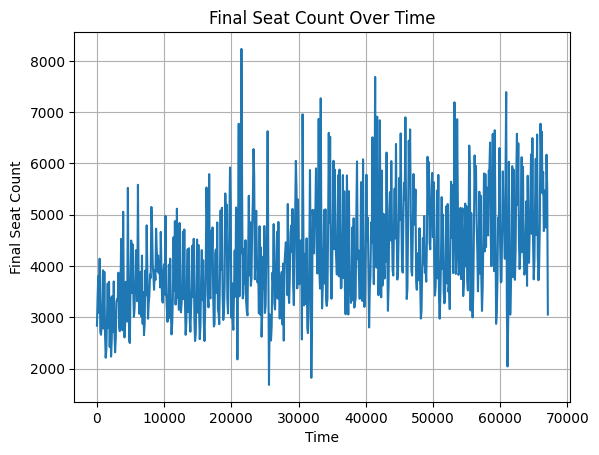

In [5]:
plt.plot(ts_45_46['final_seatcount'])
plt.title("Final Seat Count Over Time")
plt.xlabel("Time")
plt.ylabel("Final Seat Count")
plt.grid(True)
plt.show()

In [3]:
unique_pairs=set(zip(train['srcid'], train['destid']))

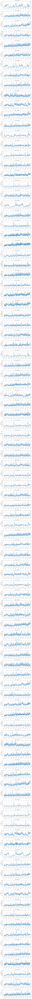

In [7]:
n=len(unique_pairs)
fig, axes = plt.subplots(n,1, figsize= (10,3*n))

for i, (s, d) in enumerate(unique_pairs):
    subset = train[(train['srcid'] == s) & (train['destid'] == d)].copy()
    subset['doj'] = pd.to_datetime(subset['doj'])
    axes[i].plot(subset['doj'], subset['final_seatcount'])
    axes[i].set_title(f"Src {s} → Dest {d}")
    axes[i].set_ylabel("Seat Count")

    # Format x-axis to show Month + Year
    axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))  # e.g., "Mar 2023"
    axes[i].xaxis.set_major_locator(mdates.MonthLocator(interval=2))  #  tick every 2 months

    # Rotate tick labels for clarity
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True)

plt.tight_layout()
plt.show()

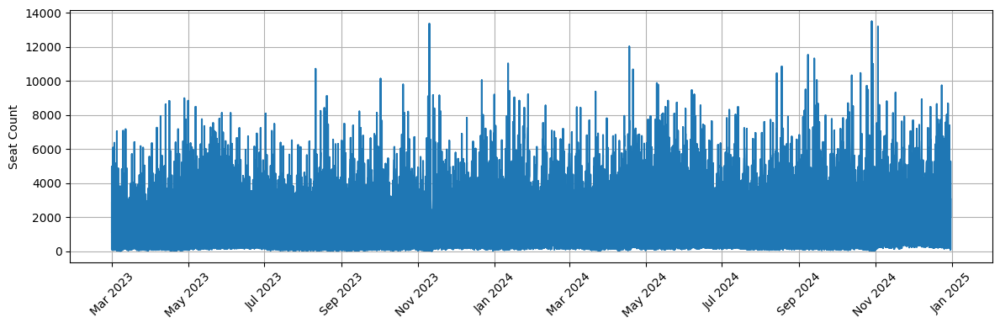

In [8]:
train['doj'] = pd.to_datetime(train['doj'])


plt.figure(figsize=(12, 4))
plt.plot(train['doj'], train['final_seatcount'])


plt.ylabel("Seat Count")

# Format x-axis: Month + Year
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))

# Rotate ticks
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [9]:
ts_45_46[['doj','final_seatcount']]

,doj,final_seatcount
0,2023-03-01,2838.0
100,2023-03-02,3392.0
200,2023-03-03,3808.0
300,2023-03-04,3090.0
400,2023-03-05,4144.0
...,...,...
66700,2024-12-27,5478.0
66800,2024-12-28,4752.0
66900,2024-12-29,6170.0
67000,2024-12-30,5552.0


In [10]:


# Ensure safe copy and proper datetime
ts_45_46 = ts_45_46.copy()
ts_45_46['doj'] = pd.to_datetime(ts_45_46['doj'])
ts_45_46.set_index('doj', inplace=True)

# Monthly resampling using the new 'ME' (Month-End)
monthly_ts = ts_45_46.resample('ME').sum().reset_index()

print(monthly_ts.head())


         doj  srcid  destid  final_seatcount
0 2023-03-31   1395    1426          94660.0
1 2023-04-30   1350    1380         106000.0
2 2023-05-31   1395    1426         118262.0
3 2023-06-30   1350    1380         110912.0
4 2023-07-31   1395    1426         110188.0


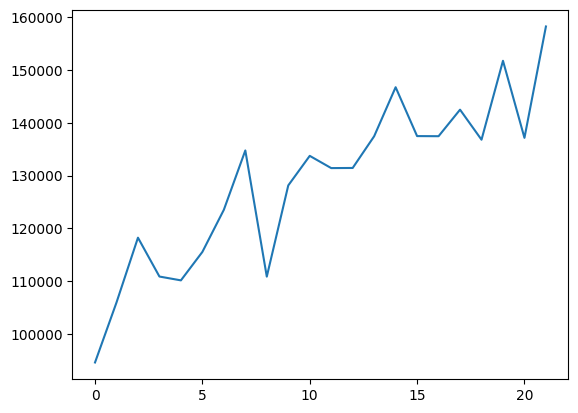

In [11]:

plt.plot(monthly_ts['final_seatcount'])

Slope: 0.14140569487988852
Intercept: -1.6261654911187169


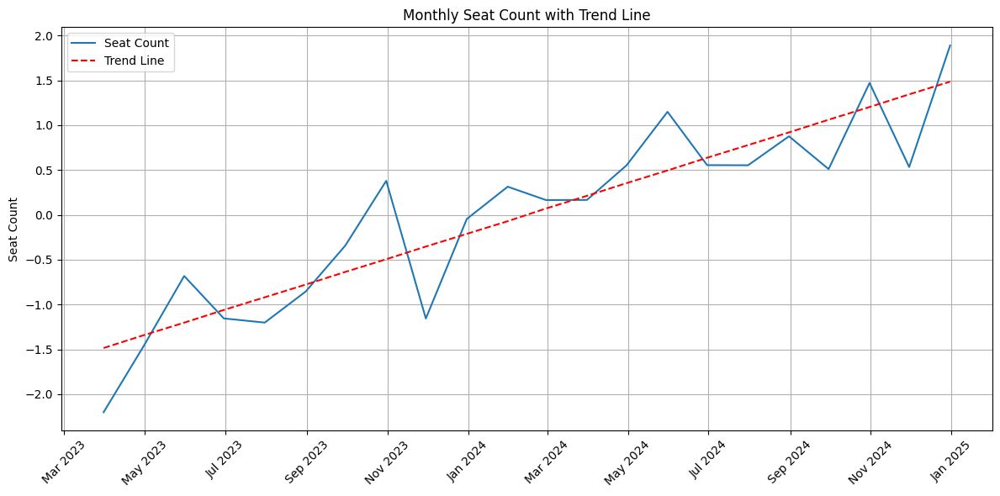

In [12]:
x = monthly_ts['doj']
y = monthly_ts['final_seatcount']
y = monthly_ts['final_seatcount'].values.reshape(-1, 1)

scaler = StandardScaler()
y_scaled = scaler.fit_transform(y)  #  First fit, then transform

# Optional: Flatten back to 1D if needed
y_scaled = y_scaled.ravel()
# Fit linear regression
# Fit a linear trend line: y = mx + c
coeffs = np.polyfit(range(1,len(x)+1), y_scaled, deg=1)
trend_line = np.poly1d(coeffs)
slope = coeffs[0]
intercept = coeffs[1]

print("Slope:", slope)
print("Intercept:", intercept)
# Plot original data
plt.figure(figsize=(12, 6))
plt.plot(monthly_ts['doj'], y_scaled, label='Seat Count')

# Plot trend line
plt.plot(monthly_ts['doj'], trend_line(range(1,len(x)+1)), color='red', linestyle='--', label='Trend Line')

# Formatting
plt.title("Monthly Seat Count with Trend Line")
plt.ylabel("Seat Count")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Slope: 2.35694593083822
Intercept: 3425.5365037967467


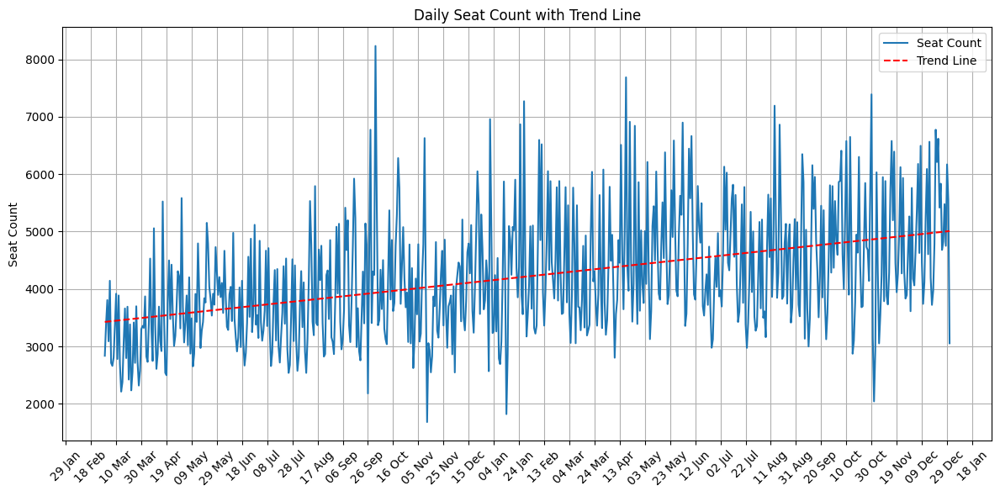

In [37]:

ts_45_46=train[(train['srcid']==45) & (train['destid']==46)]
x = ts_45_46['doj']
y = ts_45_46['final_seatcount']

# Fit linear regression
# Fit a linear trend line: y = mx + c
coeffs = np.polyfit(range(1,len(x)+1), y, deg=1)
trend_line = np.poly1d(coeffs)
slope = coeffs[0]
intercept = coeffs[1]

print("Slope:", slope)
print("Intercept:", intercept)
# Plot original data
plt.figure(figsize=(12, 6))
plt.plot(ts_45_46['doj'], y, label='Seat Count')

# Plot trend line
plt.plot(ts_45_46['doj'], trend_line(range(1,len(x)+1)), color='red', linestyle='--', label='Trend Line')

# Formatting
plt.title("Daily Seat Count with Trend Line")
plt.ylabel("Seat Count")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=20))
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

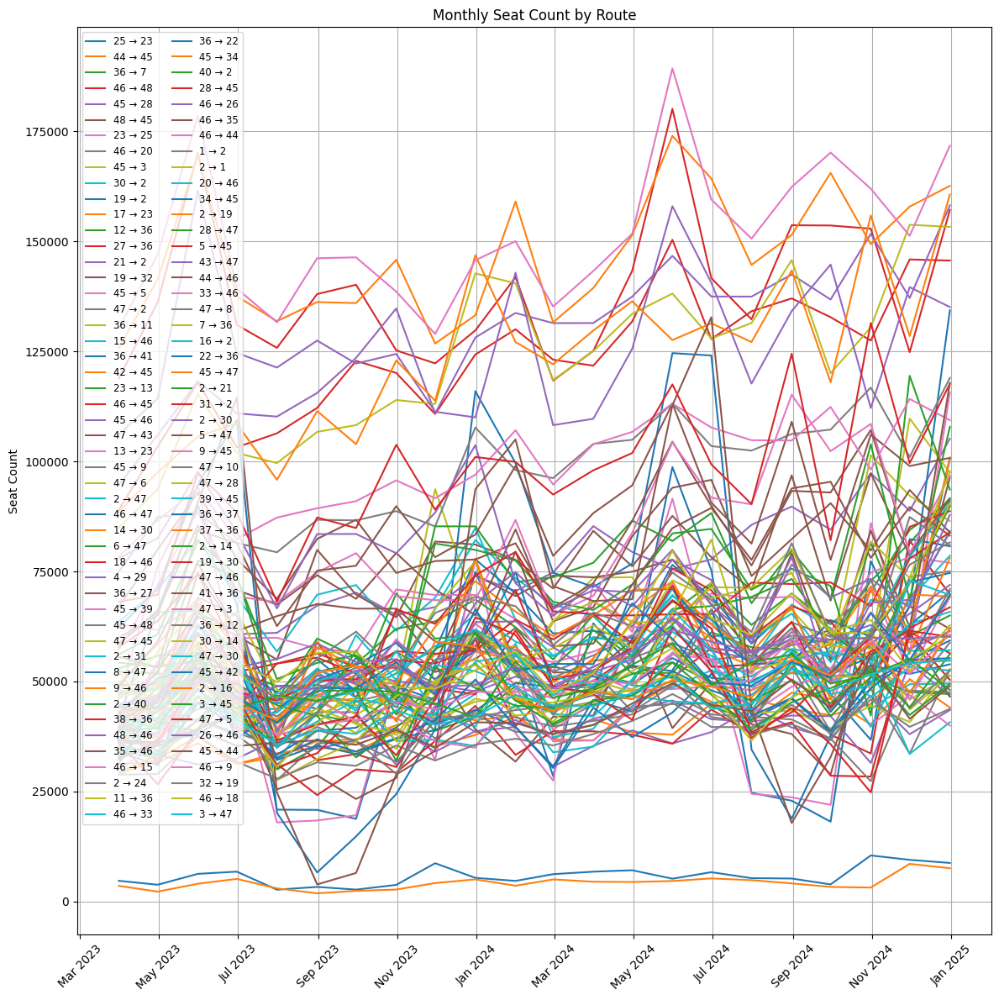

In [17]:

plt.figure(figsize=(12, 12))
for (s, d) in unique_pairs:
    subset = train[(train['srcid'] == s) & (train['destid'] == d)].copy()
    subset['doj'] = pd.to_datetime(subset['doj'])
    subset.set_index('doj', inplace=True)

    # Monthly resampling
    monthly_ts = subset['final_seatcount'].resample('ME').sum().reset_index()

    # Plot each line
    plt.plot(monthly_ts['doj'], monthly_ts['final_seatcount'], label=f"{s} → {d}")

# Titles and formatting
plt.title("Monthly Seat Count by Route")
plt.ylabel("Seat Count")

# X-axis formatting
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=45)

plt.grid(True)
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()

## Segregatnig the routes by slopes

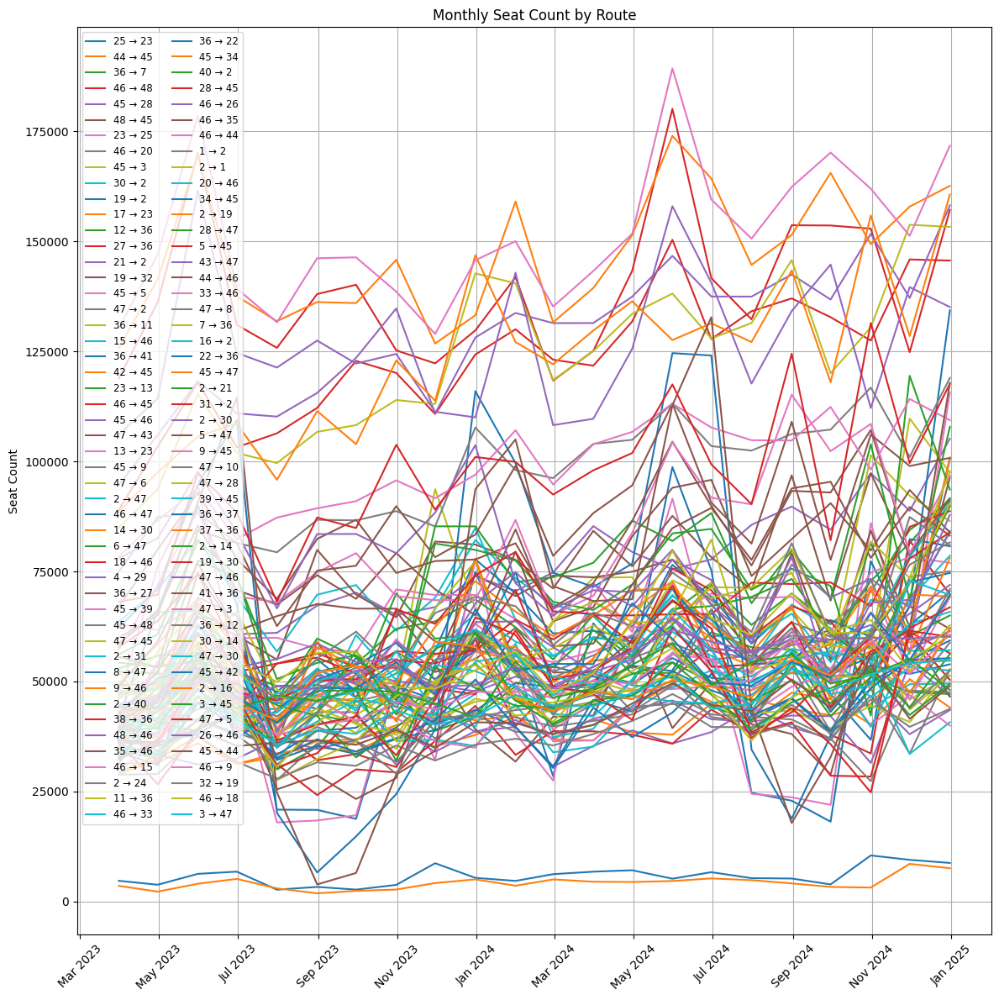

In [18]:
high_monthly_trend=[]
moderate_monthly_trend=[]
no_monthly_trend=[]
plt.figure(figsize=(12, 12))
for (s, d) in unique_pairs:
    subset = train[(train['srcid'] == s) & (train['destid'] == d)].copy()
    subset['doj'] = pd.to_datetime(subset['doj'])
    subset.set_index('doj', inplace=True)

    # Monthly resampling
    monthly_ts = subset['final_seatcount'].resample('ME').sum().reset_index()

    x = monthly_ts['doj']
    y = monthly_ts['final_seatcount']

    y = monthly_ts['final_seatcount'].values.reshape(-1, 1)

    scaler = StandardScaler()
    y_scaled = scaler.fit_transform(y) 
    y_scaled = y_scaled.ravel()

    # Fit a linear trend line: y = mx + c
    coeffs = np.polyfit(range(1,len(x)+1), y_scaled, deg=1)
    trend_line = np.poly1d(coeffs)
    slope = coeffs[0]
    intercept = coeffs[1]
    if abs(slope)>=0.021:
        plt.plot(monthly_ts['doj'], monthly_ts['final_seatcount'], label=f"{s} → {d}")
        #plt.plot(monthly_ts['doj'], trend_line(x), color='red', linestyle='--', label='Trend Line')
        high_monthly_trend.append((s,d))
    elif abs(slope) >=0.012:
        plt.plot(monthly_ts['doj'], monthly_ts['final_seatcount'], label=f"{s} → {d}")
        moderate_monthly_trend.append((s,d))
    else:
        plt.plot(monthly_ts['doj'], monthly_ts['final_seatcount'], label=f"{s} → {d}")
        no_monthly_trend.append((s,d))

# Titles and formatting
plt.title("Monthly Seat Count by Route")
plt.ylabel("Seat Count")

# X-axis formatting
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=45)

plt.grid(True)
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()

In [ ]:
len(jr)

In [ ]:
len(unique_pairs)

## Segregating the routes by daily trend lines

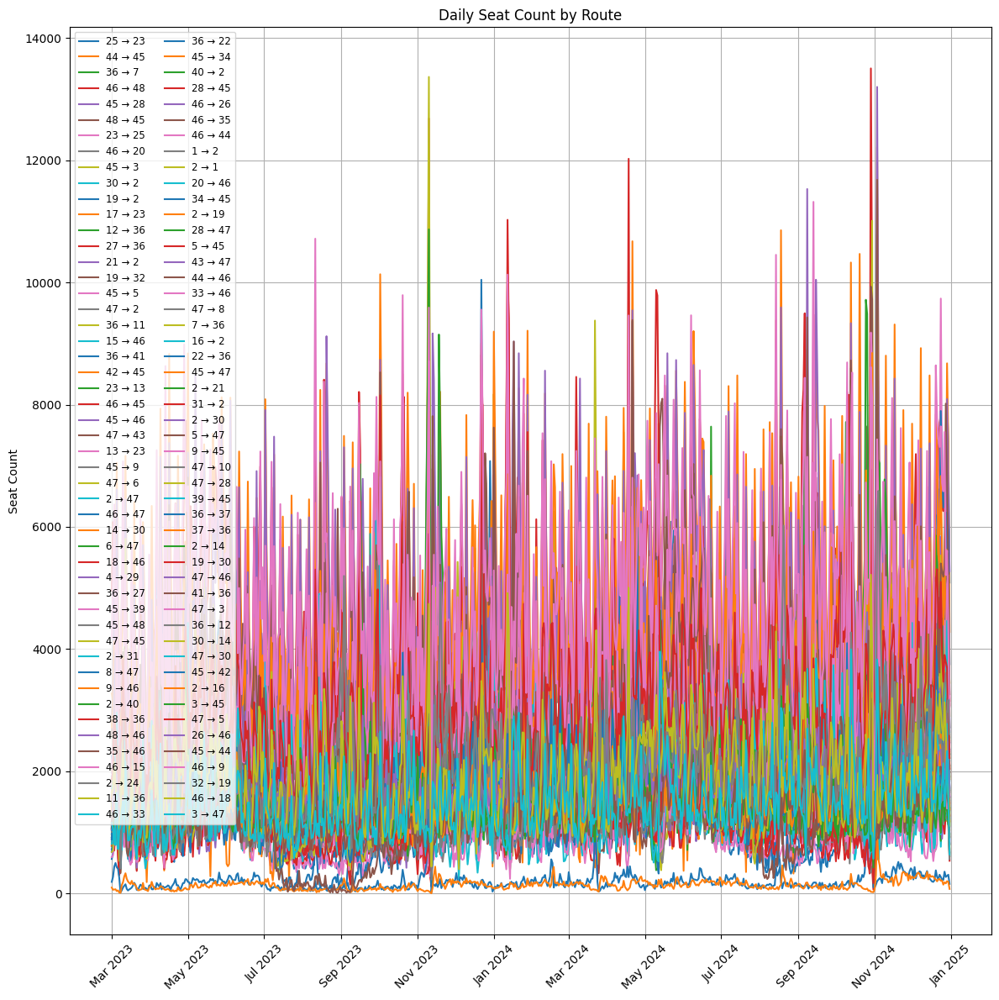

In [59]:
high_daily_trend=[]
moderate_daily_trend=[]
no_daily_trend=[]
plt.figure(figsize=(12, 12))

for (s, d) in unique_pairs:
    subset_daily = train[(train['srcid'] == s) & (train['destid'] == d)].copy()
    subset_daily['doj'] = pd.to_datetime(subset_daily['doj'])
    

    x_daily = subset_daily['doj']
    y_daily = subset_daily['final_seatcount']

    # Fit a linear trend line: y = mx + c
    coeffs_daily = np.polyfit(range(1,len(x_daily)+1), y_daily, deg=1)
    trend_line_daily = np.poly1d(coeffs_daily)
    slope_daily = coeffs_daily[0]
    angle_daily = np.degrees(np.arctan(slope_daily))
    #intercept = coeffs_daily[1]
    if abs(angle_daily)>=40:
        plt.plot(subset_daily['doj'], subset_daily['final_seatcount'], label=f"{s} → {d}")
        high_daily_trend.append((s,d))
    elif abs(angle_daily) >=20:
        plt.plot(subset_daily['doj'], subset_daily['final_seatcount'], label=f"{s} → {d}")
        moderate_daily_trend.append((s,d))
    else:
        plt.plot(subset_daily['doj'], subset_daily['final_seatcount'], label=f"{s} → {d}")
        no_daily_trend.append((s,d))

# Titles and formatting
plt.title("Daily Seat Count by Route")
plt.ylabel("Seat Count")

# X-axis formatting
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=45)

plt.grid(True)
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()

In [54]:
subset_daily = train[(train['srcid'] == 25) & (train['destid'] == 23)].copy()
subset_daily['doj'] = pd.to_datetime(subset_daily['doj'])


x_daily = subset_daily['doj']
y_daily = subset_daily['final_seatcount']

# Fit a linear trend line: y = mx + c
coeffs_daily = np.polyfit(range(1,len(x_daily)+1), y_daily, deg=1)
trend_line_daily = np.poly1d(coeffs_daily)
slope_daily = coeffs_daily[0]
intercept_daily = coeffs_daily[1]
angle_daily = np.degrees(np.arctan(slope_daily))

print(f"Slope: {slope_daily}")
print(f"Intercept: {intercept_daily}")
print(f"Angle: {angle_daily}")


Slope: 0.6902830076166985
Intercept: 1504.981672698885
Angle: 34.61665922277809


In [60]:
len(high_daily_trend),len(moderate_daily_trend),len(no_daily_trend)

(50, 42, 8)

### Adding Holidays and events

In [66]:
!pip install workalendar


[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### Merging the transcation and train dataset

In [15]:
merged_df=train.merge(transcation,on=['doj','srcid','destid'],how='right')

In [16]:
merged_df

,doj,srcid,destid,final_seatcount,doi,srcid_region,destid_region,srcid_tier,destid_tier,cumsum_seatcount,cumsum_searchcount,dbd
0,2023-03-01,45,46,2838.0,2023-01-30,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,76.0,30
1,2023-03-01,46,45,2298.0,2023-01-30,Tamil Nadu,Karnataka,Tier 1,Tier 1,8.0,70.0,30
2,2023-03-01,45,47,2720.0,2023-01-30,Karnataka,Andhra Pradesh,Tier 1,Tier 1,4.0,142.0,30
3,2023-03-01,47,45,2580.0,2023-01-30,Andhra Pradesh,Karnataka,Tier 1,Tier 1,0.0,68.0,30
4,2023-03-01,46,9,4185.0,2023-01-30,Tamil Nadu,Tamil Nadu,Tier 1,Tier2,9.0,162.0,30
...,...,...,...,...,...,...,...,...,...,...,...,...
2266095,2025-02-28,2,24,NaN,2025-02-28,Maharashtra and Goa,Maharashtra and Goa,Tier 1,Tier2,0.0,0.0,0
2266096,2025-02-28,44,45,NaN,2025-02-28,Tamil Nadu,Karnataka,Tier2,Tier 1,0.0,0.0,0
2266097,2025-02-28,47,10,NaN,2025-02-28,Andhra Pradesh,Andhra Pradesh,Tier 1,Tier 3,0.0,0.0,0
2266098,2025-02-28,38,36,NaN,2025-02-28,Rest of North,Delhi,Tier 1,Tier2,0.0,0.0,0


In [17]:
#merged_df=merged_df.drop(columns='final_seatcount')
merged_df['final_seatcount'] = merged_df.groupby(
    ['doj', 'srcid', 'destid']
)['cumsum_seatcount'].transform('max')



In [5]:
# #Replacing NaNs with proper values
# for (s,d) in unique_pairs:
#     merged_df.loc[(merged_df['srcid']==s) & (merged_df['destid']==d) & (merged_df['final_seatcount'].isna()),'final_seatcount'] = merged_df[(merged_df['srcid']==s) & (merged_df['destid']==d)]['final_seatcount'].iloc[0] 
unpatterned_df = merged_df[merged_df['final_seatcount'].isna()]
patterned_df = merged_df.dropna(subset=['final_seatcount'])

In [ ]:
patterned_df.loc[:,'final_searches'] = patterned_df.groupby(
    ['doj','doi', 'srcid', 'destid']
)['cumsum_searchcount'].transform('max')

In [7]:
patterned_df[(patterned_df['srcid']==45) & (patterned_df['destid']==46)]

,doj,srcid,destid,final_seatcount,doi,srcid_region,destid_region,srcid_tier,destid_tier,cumsum_seatcount,cumsum_searchcount,dbd,final_searches
0,2023-03-01,45,46,2838.0,2023-01-30,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,76.0,30,76.0
100,2023-03-01,45,46,2838.0,2023-01-31,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,94.0,29,94.0
200,2023-03-01,45,46,2838.0,2023-02-01,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,108.0,28,108.0
300,2023-03-01,45,46,2838.0,2023-02-02,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,126.0,27,126.0
400,2023-03-01,45,46,2838.0,2023-02-03,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,146.0,26,146.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082700,2024-12-31,45,46,3056.0,2024-12-27,Karnataka,Tamil Nadu,Tier 1,Tier 1,420.0,13164.0,4,13164.0
2082800,2024-12-31,45,46,3056.0,2024-12-28,Karnataka,Tamil Nadu,Tier 1,Tier 1,526.0,15940.0,3,15940.0
2082900,2024-12-31,45,46,3056.0,2024-12-29,Karnataka,Tamil Nadu,Tier 1,Tier 1,728.0,20568.0,2,20568.0
2083000,2024-12-31,45,46,3056.0,2024-12-30,Karnataka,Tamil Nadu,Tier 1,Tier 1,1560.0,38680.0,1,38680.0


In [20]:
patterned_df[patterned_df['dbd']>=15]

,doj,srcid,destid,final_seatcount,doi,srcid_region,destid_region,srcid_tier,destid_tier,cumsum_seatcount,cumsum_searchcount,dbd
0,2023-03-01,45,46,2838.0,2023-01-30,Karnataka,Tamil Nadu,Tier 1,Tier 1,8.0,76.0,30
1,2023-03-01,46,45,2298.0,2023-01-30,Tamil Nadu,Karnataka,Tier 1,Tier 1,8.0,70.0,30
2,2023-03-01,45,47,2720.0,2023-01-30,Karnataka,Andhra Pradesh,Tier 1,Tier 1,4.0,142.0,30
3,2023-03-01,47,45,2580.0,2023-01-30,Andhra Pradesh,Karnataka,Tier 1,Tier 1,0.0,68.0,30
4,2023-03-01,46,9,4185.0,2023-01-30,Tamil Nadu,Tamil Nadu,Tier 1,Tier2,9.0,162.0,30
...,...,...,...,...,...,...,...,...,...,...,...,...
2081695,2024-12-31,2,24,800.0,2024-12-16,Maharashtra and Goa,Maharashtra and Goa,Tier 1,Tier2,20.0,1300.0,15
2081696,2024-12-31,44,45,1360.0,2024-12-16,Tamil Nadu,Karnataka,Tier2,Tier 1,75.0,1220.0,15
2081697,2024-12-31,47,10,560.0,2024-12-16,Andhra Pradesh,Andhra Pradesh,Tier 1,Tier 3,15.0,1560.0,15
2081698,2024-12-31,38,36,535.0,2024-12-16,Rest of North,Delhi,Tier 1,Tier2,0.0,340.0,15


In [105]:

patterned_df['doj'] = pd.to_datetime(patterned_df['doj'])
indian_holidays = holidays.India(years=(merged_df['doj'].dt.year.min(),merged_df['doj'].dt.year.max()))# here (years = (min yeat, max year))
print(indian_holidays)

# Check if a date is a holiday

print(datetime.date(2024, 8, 15) in indian_holidays)

{datetime.date(2025, 1, 26): 'Republic Day', datetime.date(2025, 8, 15): 'Independence Day', datetime.date(2025, 10, 2): 'Dussehra; Gandhi Jayanti', datetime.date(2025, 5, 12): 'Buddha Purnima', datetime.date(2025, 10, 20): 'Diwali', datetime.date(2025, 8, 16): 'Janmashtami', datetime.date(2025, 4, 10): 'Mahavir Jayanti', datetime.date(2025, 2, 26): 'Maha Shivaratri', datetime.date(2025, 11, 5): 'Guru Nanak Jayanti', datetime.date(2025, 7, 6): 'Muharram', datetime.date(2025, 9, 5): 'Milad-un-Nabi', datetime.date(2025, 3, 31): 'Id-ul-Fitr', datetime.date(2025, 6, 7): 'Bakrid', datetime.date(2025, 4, 18): 'Good Friday', datetime.date(2025, 12, 25): 'Christmas', datetime.date(2023, 1, 26): 'Republic Day', datetime.date(2023, 8, 15): 'Independence Day', datetime.date(2023, 10, 2): 'Gandhi Jayanti', datetime.date(2023, 5, 5): 'Buddha Purnima', datetime.date(2023, 11, 12): 'Diwali', datetime.date(2023, 9, 7): 'Janmashtami', datetime.date(2023, 10, 24): 'Dussehra', datetime.date(2023, 4, 4): 

In [107]:
type(indian_holidays)

holidays.countries.india.India

In [112]:
!pip install -U xgboost optuna

  Using cached xgboost-3.0.2-py3-none-win_amd64.whl.metadata (2.1 kB)
Using cached xgboost-3.0.2-py3-none-win_amd64.whl (150.0 MB)
   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ---------------------------------------- 2.1/2.1 MB 14.8 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.9.0
    Uninstalling typing_extensions-4.9.0:
      Successfully uninstalled typing_extensions-4.9.0
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.1.3
    Uninstalling xgboost-2.1.3:
      Successfully uninstalled xgboost-2.1.3



[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [24]:
def enrich(df):
    df=df.copy()
    df['doj'] = pd.to_datetime(df['doj'], errors='coerce')
    df["doj_dow"] = df["doj"].dt.dayofweek
    df["is_weekend"] = df["doj_dow"].isin([5, 6]).astype(int)
    df["doj_year"] = df["doj"].dt.year
    df["doj_month"] = df["doj"].dt.month
    df["doj_day"] = df["doj"].dt.day

    df["search_per_seat"] = df["cumsum_searchcount"] / (df["cumsum_seatcount"] + 1)
    df["seat_to_search_ratio"] = (df["cumsum_seatcount"] + 1) / (df["cumsum_searchcount"] + 1)

    # Velocity (difference) per route if needed
    df["booking_velocity"] = df.groupby(['srcid', 'destid'])["cumsum_seatcount"].diff().fillna(0)
    df["search_velocity"] = df.groupby(['srcid', 'destid'])["cumsum_searchcount"].diff().fillna(0)

    # Monthly trends
    df["month_search_avg"] = df.groupby("doj_month")["cumsum_searchcount"].transform("mean")
    df["month_booking_avg"] = df.groupby("doj_month")["cumsum_seatcount"].transform("mean")
    # --- Cyclical encodings ---
    df['day_sin'] = np.sin(2 * np.pi * df['doj_day'] / 31)
    df['day_cos'] = np.cos(2 * np.pi * df['doj_day'] / 31)
    
    df['month_sin'] = np.sin(2 * np.pi * df['doj_month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['doj_month'] / 12)
    
    df['dow_sin'] = np.sin(2 * np.pi * df['doj_dow'] / 7)
    df['dow_cos'] = np.cos(2 * np.pi * df['doj_dow'] / 7)

    # Add holiday flag
    indian_holidays = holidays.India(years=range(df['doj'].dt.year.min(), df['doj'].dt.year.max() + 1))
    df['is_holiday'] = df['doj'].apply(lambda x: 1 if x in indian_holidays else 0)

    df = df[df['dbd']>=15]
    return df

In [25]:
patterned_df = enrich(patterned_df)

In [26]:
cat_cols = ['srcid','destid']
label_encoders={}
for col in cat_cols:
    
    le = LabelEncoder()
    patterned_df[col] = le.fit_transform(patterned_df[col].astype(str))
    label_encoders[col] = le

features = [
    "cumsum_seatcount", "cumsum_searchcount", "search_per_seat",
    "booking_velocity", "search_velocity", "dow_sin",'dow_cos', "month_sin", "month_cos","day_sin", "day_cos", "is_weekend",
    "seat_to_search_ratio", "month_search_avg", "month_booking_avg", "dbd", "is_holiday"
] + cat_cols
 
X = patterned_df[features]
y = patterned_df["final_seatcount"]

In [ ]:
def objective(trial):
    params = {
        "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.1, log=True),
        "max_depth": trial.suggest_int("max_depth", 5, 15),
        "n_estimators": 1000,
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-3, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-3, 10.0, log=True),
        "tree_method": "hist",
        "random_state": 42,
        "eval_metric": "rmse"
    }

    rmse_scores = []
    
    
    for route, group in X.groupby(['srcid','destid']):
        X_route = group.copy()
        y_route = y.loc[X_route.index]
    
        tscv = TimeSeriesSplit(n_splits=5)
    
        for train_idx, val_idx in tscv.split(X_route):
            X_train, X_val = X_route.iloc[train_idx], X_route.iloc[val_idx]
            y_train, y_val = y_route.iloc[train_idx], y_route.iloc[val_idx]
    
            model = xgb.XGBRegressor(**params)
            model.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)
    
            preds = model.predict(X_val)
            rmse = np.sqrt(mean_squared_error(y_val, preds))
            rmse_scores.append(rmse)

    return np.mean(rmse_scores)

# Run the Optuna study
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=10)

print("Best hyperparameters:", study.best_params)

Best is trial 7 with value: 173.87374576829015. For Patterned Dataset
Best hyperparameters: {'learning_rate': 0.06423181727426215, 'max_depth': 15, 'subsample': 0.8627578009948246, 'colsample_bytree': 0.9410606795264984, 'reg_alpha': 1.2346373243508422, 'reg_lambda': 0.00924559420923494}

In [31]:
for route, group in X.groupby(['srcid','destid']):
    print(route)
   

(np.int64(0), np.int64(10))
(np.int64(1), np.int64(28))
(np.int64(2), np.int64(28))
(np.int64(3), np.int64(14))
(np.int64(4), np.int64(22))
(np.int64(5), np.int64(37))
(np.int64(6), np.int64(10))
(np.int64(7), np.int64(14))
(np.int64(8), np.int64(37))
(np.int64(9), np.int64(10))
(np.int64(9), np.int64(22))
(np.int64(9), np.int64(24))
(np.int64(10), np.int64(0))
(np.int64(10), np.int64(5))
(np.int64(10), np.int64(7))
(np.int64(10), np.int64(9))
(np.int64(10), np.int64(12))
(np.int64(10), np.int64(15))
(np.int64(10), np.int64(22))
(np.int64(10), np.int64(23))
(np.int64(10), np.int64(31))
(np.int64(10), np.int64(38))
(np.int64(11), np.int64(37))
(np.int64(12), np.int64(10))
(np.int64(13), np.int64(28))
(np.int64(14), np.int64(4))
(np.int64(14), np.int64(16))
(np.int64(15), np.int64(14))
(np.int64(16), np.int64(37))
(np.int64(17), np.int64(28))
(np.int64(18), np.int64(36))
(np.int64(18), np.int64(38))
(np.int64(19), np.int64(36))
(np.int64(19), np.int64(38))
(np.int64(20), np.int64(5))
(np

In [ ]:


params = {
        "learning_rate": 0.06423181727426215,
        "max_depth": 15,
        "n_estimators": 1000,
        "subsample": 0.8627578009948246,
        "colsample_bytree": 0.9410606795264984,
        "reg_alpha": 1.2346373243508422,
        "reg_lambda": 0.00924559420923494,
        "tree_method": "hist",
        "random_state": 42,
        "eval_metric": "rmse"
    }

rmse_scores = []


for route, group in X.groupby(['srcid','destid']):
    X_route = group.copy()
    y_route = y.loc[X_route.index]

    tscv = TimeSeriesSplit(n_splits=5)

    for train_idx, val_idx in tscv.split(X_route):
        X_train, X_val = X_route.iloc[train_idx], X_route.iloc[val_idx]
        y_train, y_val = y_route.iloc[train_idx], y_route.iloc[val_idx]

        model = xgb.XGBRegressor(**params)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)

        preds = model.predict(X_val)
        rmse = np.sqrt(mean_squared_error(y_val, preds))
        rmse_scores.append(rmse)

print("RMSE per fold:", rmse_scores)
print("Average RMSE:", np.mean(rmse_scores))

### Final Model

In [42]:

def optimize_xgb_params(X_route, y_route, n_splits=3, n_trials=30):
    def objective(trial):
        params = {
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
            "max_depth": trial.suggest_int("max_depth", 3, 15),
            "n_estimators": trial.suggest_int("n_estimators", 300, 1000),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
            "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
            "tree_method": "hist",
            "random_state": 42,
            "eval_metric": "rmse"
        }

        tscv = TimeSeriesSplit(n_splits=min(n_splits, len(X_route) // 10))
        rmses = []

        for train_idx, val_idx in tscv.split(X_route):
            X_train, X_val = X_route.iloc[train_idx], X_route.iloc[val_idx]
            y_train, y_val = y_route.iloc[train_idx], y_route.iloc[val_idx]

            model = xgb.XGBRegressor(**params)
            model.fit(
                X_train, y_train,
                eval_set=[(X_val, y_val)],
                verbose=False
            )
            preds = model.predict(X_val)
            rmse = np.sqrt(mean_squared_error(y_val, preds))
            rmses.append(rmse)

        return np.mean(rmses)

    study = optuna.create_study(direction="minimize")
    study.optimize(objective, n_trials=n_trials)

    print("✅ Best hyperparameters:", study.best_params)
    print("📉 Best RMSE:", study.best_value)

    return study.best_params


In [45]:

def train_per_route_model(df, X, y, save_models=False, model_dir="models", n_splits=5):
    route_models = {}
    route_metrics = []

    grouped = df.groupby(['srcid', 'destid'])

    for (src, dest), group_df in grouped:
        print(f"🚍 Training for Route: {src} → {dest}")

        # Sort group by date
        idx = group_df.sort_values('doj').index

        X_route = X.loc[idx]
        y_route = y.loc[idx]

        tscv = TimeSeriesSplit(n_splits=min(n_splits, len(X_route) // 10))  # Safe fallback

        rmse_list = []
        for fold, (train_idx, val_idx) in enumerate(tscv.split(X_route)):
            X_train, X_val = X_route.iloc[train_idx], X_route.iloc[val_idx]
            y_train, y_val = y_route.iloc[train_idx], y_route.iloc[val_idx]

            best_params = optimize_xgb_params(X_route, y_route, n_trials=25)
            model = xgb.XGBRegressor(**best_params)

            model.fit(
                X_train, y_train,
                eval_set=[(X_val, y_val)],
                verbose=False
            )

            preds = model.predict(X_val)
            rmse = np.sqrt(mean_squared_error(y_val, preds))
            rmse_list.append(rmse)

        avg_rmse = np.mean(rmse_list)
        print(f"📊 RMSE for route {src}->{dest}: {avg_rmse:.4f}")

        route_models[(src, dest)] = model
        route_metrics.append({
            "srcid": src,
            "destid": dest,
            "avg_rmse": avg_rmse,
            "folds": len(rmse_list)
        })

        if save_models:
            joblib.dump(model, f"{model_dir}/model_{src}_{dest}.pkl")

    metrics_df = pd.DataFrame(route_metrics)
    return route_models, metrics_df


In [ ]:
models, metrics_df = train_per_route_model(patterned_df, X, y)
print(metrics_df.sort_values("avg_rmse"))


[I 2025-07-22 22:07:34,144] A new study created in memory with name: no-name-abd59a8b-bc11-495e-82cc-f3b0d8dcc007


🚍 Training for Route: 0 → 10


[I 2025-07-22 22:07:45,785] Trial 0 finished with value: 355.32641493779664 and parameters: {'learning_rate': 0.046725377248957305, 'max_depth': 15, 'n_estimators': 585, 'subsample': 0.8503070620101932, 'colsample_bytree': 0.9087998057065916, 'reg_alpha': 2.3214180330383023, 'reg_lambda': 4.407616274022668}. Best is trial 0 with value: 355.32641493779664.
[I 2025-07-22 22:07:52,021] Trial 1 finished with value: 345.8387911148884 and parameters: {'learning_rate': 0.06517041968492779, 'max_depth': 9, 'n_estimators': 545, 'subsample': 0.9153086574120779, 'colsample_bytree': 0.6644669996457154, 'reg_alpha': 2.293353533681915, 'reg_lambda': 0.5109513382305553}. Best is trial 1 with value: 345.8387911148884.
[I 2025-07-22 22:08:02,287] Trial 2 finished with value: 358.52035164433534 and parameters: {'learning_rate': 0.10043076899829763, 'max_depth': 10, 'n_estimators': 877, 'subsample': 0.8370478033194877, 'colsample_bytree': 0.995693515886399, 'reg_alpha': 3.486378469956741, 'reg_lambda': 1

✅ Best hyperparameters: {'learning_rate': 0.01121558291877753, 'max_depth': 3, 'n_estimators': 977, 'subsample': 0.6097580068247754, 'colsample_bytree': 0.7114052903139573, 'reg_alpha': 3.6799237945570735, 'reg_lambda': 1.12615487489605}
📉 Best RMSE: 336.8993830772701


[I 2025-07-22 22:11:13,971] A new study created in memory with name: no-name-676fbbf7-32df-4090-8494-cee73d1b325a
[I 2025-07-22 22:11:17,057] Trial 0 finished with value: 360.90695021527966 and parameters: {'learning_rate': 0.10965544092196086, 'max_depth': 5, 'n_estimators': 554, 'subsample': 0.6836501127146363, 'colsample_bytree': 0.9799189622162423, 'reg_alpha': 1.2354785497233145, 'reg_lambda': 1.393487593135465}. Best is trial 0 with value: 360.90695021527966.
[I 2025-07-22 22:11:18,579] Trial 1 finished with value: 368.2169943588044 and parameters: {'learning_rate': 0.24527874561799295, 'max_depth': 3, 'n_estimators': 396, 'subsample': 0.797352047202066, 'colsample_bytree': 0.6912273688534565, 'reg_alpha': 3.9149384153485745, 'reg_lambda': 2.285346677507749}. Best is trial 0 with value: 360.90695021527966.
[I 2025-07-22 22:11:24,138] Trial 2 finished with value: 366.9526280657572 and parameters: {'learning_rate': 0.2556298685588316, 'max_depth': 6, 'n_estimators': 866, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.01072762535075018, 'max_depth': 15, 'n_estimators': 717, 'subsample': 0.8258174323891185, 'colsample_bytree': 0.6307004144727838, 'reg_alpha': 4.457069770613913, 'reg_lambda': 3.1384552260038996}
📉 Best RMSE: 341.26097068995955


[I 2025-07-22 22:15:11,360] A new study created in memory with name: no-name-e92a2ddf-56e8-428b-af68-cc8dffae83ed
[I 2025-07-22 22:15:19,796] Trial 0 finished with value: 356.35524891729284 and parameters: {'learning_rate': 0.22418591144735034, 'max_depth': 10, 'n_estimators': 892, 'subsample': 0.9431687433922396, 'colsample_bytree': 0.6620682207849945, 'reg_alpha': 3.5874308906071266, 'reg_lambda': 0.5476861260041199}. Best is trial 0 with value: 356.35524891729284.
[I 2025-07-22 22:15:21,270] Trial 1 finished with value: 361.7869894293272 and parameters: {'learning_rate': 0.12256218172115267, 'max_depth': 4, 'n_estimators': 323, 'subsample': 0.8984835767008946, 'colsample_bytree': 0.7320238115804701, 'reg_alpha': 2.3369627665863786, 'reg_lambda': 4.416894447029392}. Best is trial 0 with value: 356.35524891729284.
[I 2025-07-22 22:15:32,310] Trial 2 finished with value: 355.99097742681244 and parameters: {'learning_rate': 0.10539289899431678, 'max_depth': 13, 'n_estimators': 784, 'sub

✅ Best hyperparameters: {'learning_rate': 0.022494179969819436, 'max_depth': 3, 'n_estimators': 355, 'subsample': 0.9908830887228206, 'colsample_bytree': 0.855387726450026, 'reg_alpha': 0.9639812459537372, 'reg_lambda': 0.5228741380317897}
📉 Best RMSE: 336.3536671329329


[I 2025-07-22 22:18:32,156] A new study created in memory with name: no-name-b006d1b1-24ea-420e-8e43-c13054696e18
[I 2025-07-22 22:18:41,346] Trial 0 finished with value: 356.68565744547715 and parameters: {'learning_rate': 0.29575566902395034, 'max_depth': 10, 'n_estimators': 877, 'subsample': 0.7353160000337723, 'colsample_bytree': 0.9200301324686143, 'reg_alpha': 3.9848435485261335, 'reg_lambda': 3.1910758814453652}. Best is trial 0 with value: 356.68565744547715.
[I 2025-07-22 22:18:45,795] Trial 1 finished with value: 344.6928739952552 and parameters: {'learning_rate': 0.036163475889319646, 'max_depth': 10, 'n_estimators': 361, 'subsample': 0.9905233132551402, 'colsample_bytree': 0.6960015832269547, 'reg_alpha': 4.744847265446511, 'reg_lambda': 1.3405426048347118}. Best is trial 1 with value: 344.6928739952552.
[I 2025-07-22 22:18:53,612] Trial 2 finished with value: 349.62434504761535 and parameters: {'learning_rate': 0.06842247756575881, 'max_depth': 11, 'n_estimators': 551, 'su

✅ Best hyperparameters: {'learning_rate': 0.01038182239785904, 'max_depth': 15, 'n_estimators': 494, 'subsample': 0.9712907657978086, 'colsample_bytree': 0.6412644052639687, 'reg_alpha': 2.0289959368688315, 'reg_lambda': 0.7347877848775148}
📉 Best RMSE: 339.70944807196815


[I 2025-07-22 22:21:36,012] A new study created in memory with name: no-name-ffeef111-501d-419b-a236-f8e6c943b402
[I 2025-07-22 22:21:43,078] Trial 0 finished with value: 353.9670046959779 and parameters: {'learning_rate': 0.27691383483866566, 'max_depth': 12, 'n_estimators': 566, 'subsample': 0.6554926109053789, 'colsample_bytree': 0.7652757064447244, 'reg_alpha': 1.8807088898620061, 'reg_lambda': 0.5103703825936096}. Best is trial 0 with value: 353.9670046959779.
[I 2025-07-22 22:21:47,161] Trial 1 finished with value: 371.8271244797893 and parameters: {'learning_rate': 0.2811658641061348, 'max_depth': 4, 'n_estimators': 923, 'subsample': 0.923404935703881, 'colsample_bytree': 0.9470734376088938, 'reg_alpha': 4.729624346511426, 'reg_lambda': 1.570225783907585}. Best is trial 0 with value: 353.9670046959779.
[I 2025-07-22 22:21:53,119] Trial 2 finished with value: 356.0184954260994 and parameters: {'learning_rate': 0.17893265901038305, 'max_depth': 11, 'n_estimators': 408, 'subsample'

✅ Best hyperparameters: {'learning_rate': 0.011952611989606203, 'max_depth': 15, 'n_estimators': 652, 'subsample': 0.7343393727817007, 'colsample_bytree': 0.6167861341661878, 'reg_alpha': 3.0107808478298144, 'reg_lambda': 0.005140472945175716}
📉 Best RMSE: 338.2404717520609


[I 2025-07-22 22:25:43,394] A new study created in memory with name: no-name-d70ee0b1-21f8-49ba-a619-712cf88d4151


📊 RMSE for route 0->10: 322.8613
🚍 Training for Route: 1 → 28


[I 2025-07-22 22:25:53,141] Trial 0 finished with value: 851.3017739274287 and parameters: {'learning_rate': 0.1371159502822405, 'max_depth': 13, 'n_estimators': 539, 'subsample': 0.6601410611495054, 'colsample_bytree': 0.9896774907675772, 'reg_alpha': 2.0684352300856084, 'reg_lambda': 2.80729538811755}. Best is trial 0 with value: 851.3017739274287.
[I 2025-07-22 22:26:07,680] Trial 1 finished with value: 834.3273738152742 and parameters: {'learning_rate': 0.050647218843983835, 'max_depth': 13, 'n_estimators': 828, 'subsample': 0.6247096156153022, 'colsample_bytree': 0.9512981693497876, 'reg_alpha': 0.6172979955673302, 'reg_lambda': 4.1841600474298914}. Best is trial 1 with value: 834.3273738152742.
[I 2025-07-22 22:26:18,319] Trial 2 finished with value: 850.3588316664158 and parameters: {'learning_rate': 0.24006974230991426, 'max_depth': 10, 'n_estimators': 972, 'subsample': 0.8820252706535079, 'colsample_bytree': 0.9693446435942714, 'reg_alpha': 2.497953159733183, 'reg_lambda': 2.8

✅ Best hyperparameters: {'learning_rate': 0.01072468718732078, 'max_depth': 3, 'n_estimators': 696, 'subsample': 0.9322615140075399, 'colsample_bytree': 0.9057111299242765, 'reg_alpha': 2.8424581961175583, 'reg_lambda': 0.7443925462611841}
📉 Best RMSE: 792.5358604946481


[I 2025-07-22 22:28:48,724] A new study created in memory with name: no-name-80346794-07a6-441b-acd8-3819b677a1d9
[I 2025-07-22 22:28:57,588] Trial 0 finished with value: 838.5481826738805 and parameters: {'learning_rate': 0.10122777904246184, 'max_depth': 11, 'n_estimators': 558, 'subsample': 0.6123488535819325, 'colsample_bytree': 0.9534153072181138, 'reg_alpha': 1.0701686524730947, 'reg_lambda': 1.9726458419245692}. Best is trial 0 with value: 838.5481826738805.
[I 2025-07-22 22:29:06,616] Trial 1 finished with value: 843.7818552790308 and parameters: {'learning_rate': 0.15374208758470448, 'max_depth': 12, 'n_estimators': 684, 'subsample': 0.770063228295808, 'colsample_bytree': 0.6915984269077722, 'reg_alpha': 4.999386406519875, 'reg_lambda': 0.5612025817742922}. Best is trial 0 with value: 838.5481826738805.
[I 2025-07-22 22:29:22,952] Trial 2 finished with value: 836.4769018835965 and parameters: {'learning_rate': 0.11852650864164556, 'max_depth': 15, 'n_estimators': 991, 'subsamp

✅ Best hyperparameters: {'learning_rate': 0.02360392237349759, 'max_depth': 3, 'n_estimators': 829, 'subsample': 0.9256051637544942, 'colsample_bytree': 0.607767078079281, 'reg_alpha': 3.490311779137623, 'reg_lambda': 3.9349532967809964}
📉 Best RMSE: 785.2494830082624


[I 2025-07-22 22:31:03,758] A new study created in memory with name: no-name-2cb7f981-bc6b-4cd1-b6d9-44d5b5694616
[I 2025-07-22 22:31:05,667] Trial 0 finished with value: 874.9714385327494 and parameters: {'learning_rate': 0.26837413151129175, 'max_depth': 5, 'n_estimators': 364, 'subsample': 0.7735851592993721, 'colsample_bytree': 0.7050633257018066, 'reg_alpha': 1.1756093394753981, 'reg_lambda': 2.980815643332317}. Best is trial 0 with value: 874.9714385327494.
[I 2025-07-22 22:31:14,699] Trial 1 finished with value: 829.0534431510255 and parameters: {'learning_rate': 0.04186189087923498, 'max_depth': 10, 'n_estimators': 772, 'subsample': 0.700061702662165, 'colsample_bytree': 0.8304387141533255, 'reg_alpha': 4.35791909655595, 'reg_lambda': 4.958602055017422}. Best is trial 1 with value: 829.0534431510255.
[I 2025-07-22 22:31:35,935] Trial 2 finished with value: 827.4159032953352 and parameters: {'learning_rate': 0.056464244730527455, 'max_depth': 15, 'n_estimators': 911, 'subsample'

✅ Best hyperparameters: {'learning_rate': 0.011134522105904017, 'max_depth': 4, 'n_estimators': 761, 'subsample': 0.9199759840754099, 'colsample_bytree': 0.6161039857300071, 'reg_alpha': 4.906591522079969, 'reg_lambda': 2.478362298855169}
📉 Best RMSE: 793.2154925128676


[I 2025-07-22 22:33:19,373] A new study created in memory with name: no-name-18e85724-6a03-4490-9b41-c6736e2f8ee8
[I 2025-07-22 22:33:31,219] Trial 0 finished with value: 836.8423894488802 and parameters: {'learning_rate': 0.028886932853421088, 'max_depth': 10, 'n_estimators': 912, 'subsample': 0.8129127944650139, 'colsample_bytree': 0.8569707462619258, 'reg_alpha': 2.4836229963425778, 'reg_lambda': 1.2848805981935596}. Best is trial 0 with value: 836.8423894488802.
[I 2025-07-22 22:33:41,725] Trial 1 finished with value: 869.1143723251317 and parameters: {'learning_rate': 0.2625089852533468, 'max_depth': 12, 'n_estimators': 961, 'subsample': 0.8946186015325279, 'colsample_bytree': 0.6868912058033507, 'reg_alpha': 2.612068985473342, 'reg_lambda': 0.4213937197025841}. Best is trial 0 with value: 836.8423894488802.
[I 2025-07-22 22:33:45,806] Trial 2 finished with value: 882.9425690422322 and parameters: {'learning_rate': 0.29229193889377786, 'max_depth': 6, 'n_estimators': 651, 'subsamp

✅ Best hyperparameters: {'learning_rate': 0.03183748397478589, 'max_depth': 3, 'n_estimators': 371, 'subsample': 0.8476003960911724, 'colsample_bytree': 0.9333579818343035, 'reg_alpha': 4.621915718411609, 'reg_lambda': 2.370527833405217}
📉 Best RMSE: 791.2090061169673


[I 2025-07-22 22:35:19,367] A new study created in memory with name: no-name-d6e702a2-a588-478e-9611-bdbef35447f7
[I 2025-07-22 22:35:26,907] Trial 0 finished with value: 821.5015096942143 and parameters: {'learning_rate': 0.17914857893166247, 'max_depth': 7, 'n_estimators': 981, 'subsample': 0.7351418924354869, 'colsample_bytree': 0.9434264221687917, 'reg_alpha': 3.981129777145771, 'reg_lambda': 1.4674473139922801}. Best is trial 0 with value: 821.5015096942143.
[I 2025-07-22 22:35:35,622] Trial 1 finished with value: 842.9144716831 and parameters: {'learning_rate': 0.13437715369690637, 'max_depth': 10, 'n_estimators': 737, 'subsample': 0.6831898225281796, 'colsample_bytree': 0.8347426818198369, 'reg_alpha': 3.9618238825433423, 'reg_lambda': 0.261833643505206}. Best is trial 0 with value: 821.5015096942143.
[I 2025-07-22 22:35:45,590] Trial 2 finished with value: 842.590182656365 and parameters: {'learning_rate': 0.04467707628986545, 'max_depth': 9, 'n_estimators': 949, 'subsample': 0

✅ Best hyperparameters: {'learning_rate': 0.010148727057050019, 'max_depth': 4, 'n_estimators': 879, 'subsample': 0.8931651652310044, 'colsample_bytree': 0.7733540971953938, 'reg_alpha': 0.04328941431256439, 'reg_lambda': 0.5753296089498191}
📉 Best RMSE: 788.2641931593458


[I 2025-07-22 22:37:27,139] A new study created in memory with name: no-name-4543ea2a-bfdf-43a6-bff0-9b52b2e2d00a


📊 RMSE for route 1->28: 802.3789
🚍 Training for Route: 2 → 28


[I 2025-07-22 22:37:30,530] Trial 0 finished with value: 835.1972395355523 and parameters: {'learning_rate': 0.2292624941371392, 'max_depth': 5, 'n_estimators': 639, 'subsample': 0.8888002457428814, 'colsample_bytree': 0.7089620378198966, 'reg_alpha': 4.67889731500656, 'reg_lambda': 4.057742160130816}. Best is trial 0 with value: 835.1972395355523.
[I 2025-07-22 22:37:37,495] Trial 1 finished with value: 831.0711569546538 and parameters: {'learning_rate': 0.14690632297213554, 'max_depth': 7, 'n_estimators': 869, 'subsample': 0.6149975878697281, 'colsample_bytree': 0.8452739465842959, 'reg_alpha': 1.1623962892314699, 'reg_lambda': 4.146393675263629}. Best is trial 1 with value: 831.0711569546538.
[I 2025-07-22 22:37:46,612] Trial 2 finished with value: 874.5427530341034 and parameters: {'learning_rate': 0.26863400979516416, 'max_depth': 15, 'n_estimators': 600, 'subsample': 0.9227727515090123, 'colsample_bytree': 0.9258567911047976, 'reg_alpha': 4.665400834528794, 'reg_lambda': 3.827149

✅ Best hyperparameters: {'learning_rate': 0.0249443060306805, 'max_depth': 3, 'n_estimators': 397, 'subsample': 0.7648883345909361, 'colsample_bytree': 0.6596250385068168, 'reg_alpha': 2.5581652767122858, 'reg_lambda': 3.142532577533364}
📉 Best RMSE: 785.6169549060461


[I 2025-07-22 22:39:23,127] A new study created in memory with name: no-name-0ae3eb3b-0919-46b7-834a-9e327e56fbfa
[I 2025-07-22 22:39:29,137] Trial 0 finished with value: 824.4201567029776 and parameters: {'learning_rate': 0.1051766580633857, 'max_depth': 12, 'n_estimators': 319, 'subsample': 0.6137291804655265, 'colsample_bytree': 0.636448731406601, 'reg_alpha': 3.317793283653636, 'reg_lambda': 2.76412339926753}. Best is trial 0 with value: 824.4201567029776.
[I 2025-07-22 22:39:31,980] Trial 1 finished with value: 847.8691929570991 and parameters: {'learning_rate': 0.19811150228126828, 'max_depth': 6, 'n_estimators': 433, 'subsample': 0.7831571730511485, 'colsample_bytree': 0.8427455058657283, 'reg_alpha': 0.2141512372281973, 'reg_lambda': 1.1733504752402846}. Best is trial 0 with value: 824.4201567029776.
[I 2025-07-22 22:39:40,903] Trial 2 finished with value: 827.0706562025638 and parameters: {'learning_rate': 0.21272697517257022, 'max_depth': 9, 'n_estimators': 799, 'subsample': 

✅ Best hyperparameters: {'learning_rate': 0.04192092886791337, 'max_depth': 3, 'n_estimators': 583, 'subsample': 0.6510215953485592, 'colsample_bytree': 0.864208862571337, 'reg_alpha': 3.892380317703499, 'reg_lambda': 4.378887385760743}
📉 Best RMSE: 793.4151959042498


[I 2025-07-22 22:41:18,821] A new study created in memory with name: no-name-c9481331-0cad-4e25-967e-adb6492917cf
[I 2025-07-22 22:41:29,579] Trial 0 finished with value: 888.547171674607 and parameters: {'learning_rate': 0.16926271444917604, 'max_depth': 13, 'n_estimators': 576, 'subsample': 0.8921745000044501, 'colsample_bytree': 0.9076096832417131, 'reg_alpha': 0.4993760243285389, 'reg_lambda': 2.4888453172962532}. Best is trial 0 with value: 888.547171674607.
[I 2025-07-22 22:41:33,287] Trial 1 finished with value: 837.5518741792906 and parameters: {'learning_rate': 0.1541716571623086, 'max_depth': 4, 'n_estimators': 793, 'subsample': 0.7227972291910248, 'colsample_bytree': 0.9723449128604261, 'reg_alpha': 3.2036436101624988, 'reg_lambda': 3.394445855205425}. Best is trial 1 with value: 837.5518741792906.
[I 2025-07-22 22:41:39,351] Trial 2 finished with value: 849.4762691391256 and parameters: {'learning_rate': 0.1054017033009045, 'max_depth': 7, 'n_estimators': 760, 'subsample': 

✅ Best hyperparameters: {'learning_rate': 0.014267791495554384, 'max_depth': 10, 'n_estimators': 980, 'subsample': 0.8126547969377984, 'colsample_bytree': 0.6078708014952643, 'reg_alpha': 1.3033821399416543, 'reg_lambda': 3.5600582593191827}
📉 Best RMSE: 813.3462104598248


[I 2025-07-22 22:46:01,802] A new study created in memory with name: no-name-dd0bea2f-c36b-4881-a3dc-6f4c2bc85f16
[I 2025-07-22 22:46:08,769] Trial 0 finished with value: 878.8556967294313 and parameters: {'learning_rate': 0.20564172587721635, 'max_depth': 13, 'n_estimators': 995, 'subsample': 0.9983430215749647, 'colsample_bytree': 0.83789114180377, 'reg_alpha': 3.1944735742381343, 'reg_lambda': 0.4293379561336108}. Best is trial 0 with value: 878.8556967294313.
[I 2025-07-22 22:46:19,459] Trial 1 finished with value: 839.8185416107948 and parameters: {'learning_rate': 0.24538489276583225, 'max_depth': 13, 'n_estimators': 789, 'subsample': 0.7563295605583235, 'colsample_bytree': 0.7804216581896786, 'reg_alpha': 4.665152358097807, 'reg_lambda': 2.0173500883416033}. Best is trial 1 with value: 839.8185416107948.
[I 2025-07-22 22:46:27,261] Trial 2 finished with value: 860.1943458260699 and parameters: {'learning_rate': 0.08143826580630262, 'max_depth': 7, 'n_estimators': 997, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.015192383979686253, 'max_depth': 3, 'n_estimators': 687, 'subsample': 0.6072054333969846, 'colsample_bytree': 0.6003934634856825, 'reg_alpha': 1.7297943704812297, 'reg_lambda': 2.727792680763118}
📉 Best RMSE: 773.7614747969266


[I 2025-07-22 22:48:19,664] A new study created in memory with name: no-name-0e721501-346a-48a8-aae3-368ab609178c
[I 2025-07-22 22:48:21,165] Trial 0 finished with value: 823.0422629018534 and parameters: {'learning_rate': 0.24948801411605445, 'max_depth': 3, 'n_estimators': 386, 'subsample': 0.8419427371414158, 'colsample_bytree': 0.7994156288976925, 'reg_alpha': 1.72446403504469, 'reg_lambda': 3.4587446581904624}. Best is trial 0 with value: 823.0422629018534.
[I 2025-07-22 22:48:27,632] Trial 1 finished with value: 861.9581728278248 and parameters: {'learning_rate': 0.11744601318583733, 'max_depth': 8, 'n_estimators': 669, 'subsample': 0.9575438901119122, 'colsample_bytree': 0.8463988207303693, 'reg_alpha': 1.2684839793264806, 'reg_lambda': 0.8574876140894788}. Best is trial 0 with value: 823.0422629018534.
[I 2025-07-22 22:48:32,610] Trial 2 finished with value: 820.3250581845814 and parameters: {'learning_rate': 0.13861452830517093, 'max_depth': 7, 'n_estimators': 646, 'subsample'

✅ Best hyperparameters: {'learning_rate': 0.021199518902574543, 'max_depth': 3, 'n_estimators': 979, 'subsample': 0.7036593228957473, 'colsample_bytree': 0.70878057892585, 'reg_alpha': 3.08308917971497, 'reg_lambda': 1.8120576681651235}
📉 Best RMSE: 791.3971508048779


[I 2025-07-22 22:50:49,681] A new study created in memory with name: no-name-beb23627-a806-470d-844a-2b5aefda0f84


📊 RMSE for route 2->28: 806.4108
🚍 Training for Route: 3 → 14


[I 2025-07-22 22:51:01,885] Trial 0 finished with value: 690.0224010376633 and parameters: {'learning_rate': 0.263174100853409, 'max_depth': 14, 'n_estimators': 705, 'subsample': 0.6672135362961714, 'colsample_bytree': 0.8589378647471446, 'reg_alpha': 1.0460408285172358, 'reg_lambda': 4.553607569354911}. Best is trial 0 with value: 690.0224010376633.
[I 2025-07-22 22:51:07,323] Trial 1 finished with value: 683.5039270848812 and parameters: {'learning_rate': 0.2955722166703237, 'max_depth': 15, 'n_estimators': 371, 'subsample': 0.7428754440114739, 'colsample_bytree': 0.714297498968184, 'reg_alpha': 4.7818578797134075, 'reg_lambda': 0.10082622945034314}. Best is trial 1 with value: 683.5039270848812.
[I 2025-07-22 22:51:16,917] Trial 2 finished with value: 673.3174853838785 and parameters: {'learning_rate': 0.1277239702494103, 'max_depth': 10, 'n_estimators': 725, 'subsample': 0.8108750035317549, 'colsample_bytree': 0.697501197249387, 'reg_alpha': 1.250815867465544, 'reg_lambda': 4.55681

✅ Best hyperparameters: {'learning_rate': 0.012546912467443489, 'max_depth': 14, 'n_estimators': 802, 'subsample': 0.6865693843909526, 'colsample_bytree': 0.6391741242910597, 'reg_alpha': 1.7202278875630905, 'reg_lambda': 3.226375800961376}
📉 Best RMSE: 660.6225157032616


[I 2025-07-22 22:55:03,645] A new study created in memory with name: no-name-eeb5316e-b55c-42f6-9a49-2aa9161b4d6c
[I 2025-07-22 22:55:06,887] Trial 0 finished with value: 663.8759854010547 and parameters: {'learning_rate': 0.08348576793349322, 'max_depth': 9, 'n_estimators': 303, 'subsample': 0.7505877184909777, 'colsample_bytree': 0.7004567301901227, 'reg_alpha': 3.257358407840515, 'reg_lambda': 4.307311483351443}. Best is trial 0 with value: 663.8759854010547.
[I 2025-07-22 22:55:09,642] Trial 1 finished with value: 690.8148804748486 and parameters: {'learning_rate': 0.2876120812956223, 'max_depth': 6, 'n_estimators': 432, 'subsample': 0.7478155395928985, 'colsample_bytree': 0.8006245576203286, 'reg_alpha': 0.8760490734549142, 'reg_lambda': 2.322601634888985}. Best is trial 0 with value: 663.8759854010547.
[I 2025-07-22 22:55:18,204] Trial 2 finished with value: 681.8640568707874 and parameters: {'learning_rate': 0.25636274813912624, 'max_depth': 13, 'n_estimators': 698, 'subsample':

✅ Best hyperparameters: {'learning_rate': 0.02104181012631913, 'max_depth': 3, 'n_estimators': 304, 'subsample': 0.6101990408441827, 'colsample_bytree': 0.9965352788499197, 'reg_alpha': 2.789183830836464, 'reg_lambda': 4.603442975650346}
📉 Best RMSE: 623.4792757463014


[I 2025-07-22 22:57:01,382] A new study created in memory with name: no-name-d29fe4e4-4644-44c5-bd9a-21285a64c49f
[I 2025-07-22 22:57:06,813] Trial 0 finished with value: 668.4605557547428 and parameters: {'learning_rate': 0.04537183125086108, 'max_depth': 8, 'n_estimators': 570, 'subsample': 0.914075422683364, 'colsample_bytree': 0.7140845217532136, 'reg_alpha': 1.8876533874669859, 'reg_lambda': 1.809334492393525}. Best is trial 0 with value: 668.4605557547428.
[I 2025-07-22 22:57:14,181] Trial 1 finished with value: 707.5515715941565 and parameters: {'learning_rate': 0.22016886498241275, 'max_depth': 12, 'n_estimators': 609, 'subsample': 0.9578011295914275, 'colsample_bytree': 0.9894989888027756, 'reg_alpha': 2.5771805771635545, 'reg_lambda': 1.7882329230403615}. Best is trial 0 with value: 668.4605557547428.
[I 2025-07-22 22:57:17,541] Trial 2 finished with value: 668.8842046938402 and parameters: {'learning_rate': 0.06902583653396474, 'max_depth': 8, 'n_estimators': 354, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.010789988011597834, 'max_depth': 9, 'n_estimators': 729, 'subsample': 0.7259763246463813, 'colsample_bytree': 0.7238626428165724, 'reg_alpha': 0.16947072041508537, 'reg_lambda': 1.2098753838094303}
📉 Best RMSE: 659.1561922734519


[I 2025-07-22 23:01:03,271] A new study created in memory with name: no-name-e281214d-9cb9-4286-8b2e-8437aa11b59f
[I 2025-07-22 23:01:15,964] Trial 0 finished with value: 694.0349409400563 and parameters: {'learning_rate': 0.19321132590780382, 'max_depth': 12, 'n_estimators': 964, 'subsample': 0.7535285478483994, 'colsample_bytree': 0.8978240262132208, 'reg_alpha': 2.3126948323651653, 'reg_lambda': 2.118327554926844}. Best is trial 0 with value: 694.0349409400563.
[I 2025-07-22 23:01:19,756] Trial 1 finished with value: 634.6462767070499 and parameters: {'learning_rate': 0.01905437241064405, 'max_depth': 3, 'n_estimators': 993, 'subsample': 0.9008931365486782, 'colsample_bytree': 0.6494902658625477, 'reg_alpha': 1.2063080500620482, 'reg_lambda': 0.9110919377004784}. Best is trial 1 with value: 634.6462767070499.
[I 2025-07-22 23:01:26,487] Trial 2 finished with value: 686.1805918220398 and parameters: {'learning_rate': 0.2967186017113723, 'max_depth': 7, 'n_estimators': 863, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.012235453299742079, 'max_depth': 3, 'n_estimators': 978, 'subsample': 0.6053060678735136, 'colsample_bytree': 0.6373902627089224, 'reg_alpha': 1.3852748646519373, 'reg_lambda': 0.11107177408767166}
📉 Best RMSE: 623.3475097379034


[I 2025-07-22 23:03:29,249] A new study created in memory with name: no-name-25bbf957-f3f3-4806-90e3-7eb8060afd28
[I 2025-07-22 23:03:42,877] Trial 0 finished with value: 678.0283081463742 and parameters: {'learning_rate': 0.06291498218003948, 'max_depth': 11, 'n_estimators': 973, 'subsample': 0.9027641040522381, 'colsample_bytree': 0.8767227055610955, 'reg_alpha': 3.3071948482797184, 'reg_lambda': 1.485994276557923}. Best is trial 0 with value: 678.0283081463742.
[I 2025-07-22 23:03:55,622] Trial 1 finished with value: 668.9383275268326 and parameters: {'learning_rate': 0.10128618765085128, 'max_depth': 11, 'n_estimators': 721, 'subsample': 0.6513543143430507, 'colsample_bytree': 0.7829553032260832, 'reg_alpha': 0.3569060553422304, 'reg_lambda': 4.493452178573186}. Best is trial 1 with value: 668.9383275268326.
[I 2025-07-22 23:04:01,297] Trial 2 finished with value: 688.7329993799012 and parameters: {'learning_rate': 0.1428607729213153, 'max_depth': 11, 'n_estimators': 333, 'subsampl

✅ Best hyperparameters: {'learning_rate': 0.04119824573128278, 'max_depth': 4, 'n_estimators': 436, 'subsample': 0.8054367368368313, 'colsample_bytree': 0.6406479615639483, 'reg_alpha': 1.1018356181814382, 'reg_lambda': 2.953367884159083}
📉 Best RMSE: 650.5524677543012


[I 2025-07-22 23:06:28,060] A new study created in memory with name: no-name-10d6c80b-94ee-4c6d-96b2-a9243425ceec


📊 RMSE for route 3->14: 620.8762
🚍 Training for Route: 4 → 22


[I 2025-07-22 23:06:34,922] Trial 0 finished with value: 540.7934829810702 and parameters: {'learning_rate': 0.07325279991945585, 'max_depth': 8, 'n_estimators': 712, 'subsample': 0.9896044685732528, 'colsample_bytree': 0.6933703857261418, 'reg_alpha': 0.5269308534483702, 'reg_lambda': 1.5828743576183302}. Best is trial 0 with value: 540.7934829810702.
[I 2025-07-22 23:06:37,400] Trial 1 finished with value: 578.9312153662171 and parameters: {'learning_rate': 0.1306908802365628, 'max_depth': 6, 'n_estimators': 343, 'subsample': 0.9521388595768234, 'colsample_bytree': 0.9556051125075091, 'reg_alpha': 1.6350947374135494, 'reg_lambda': 1.9131018691791328}. Best is trial 0 with value: 540.7934829810702.
[I 2025-07-22 23:06:41,555] Trial 2 finished with value: 563.5682048938964 and parameters: {'learning_rate': 0.23936122574750812, 'max_depth': 7, 'n_estimators': 482, 'subsample': 0.668760306265662, 'colsample_bytree': 0.7926185345121273, 'reg_alpha': 2.639815779214984, 'reg_lambda': 4.0779

✅ Best hyperparameters: {'learning_rate': 0.09419704238717731, 'max_depth': 3, 'n_estimators': 511, 'subsample': 0.6065761504987717, 'colsample_bytree': 0.6387934438516594, 'reg_alpha': 1.1528192027280448, 'reg_lambda': 3.707562343604466}
📉 Best RMSE: 511.04846626735986


[I 2025-07-22 23:08:41,122] A new study created in memory with name: no-name-4f9125de-1f59-457b-b39b-85a4ce52c068
[I 2025-07-22 23:08:58,559] Trial 0 finished with value: 592.5048086151821 and parameters: {'learning_rate': 0.29697555875165094, 'max_depth': 15, 'n_estimators': 965, 'subsample': 0.7652742767752609, 'colsample_bytree': 0.8205140255644237, 'reg_alpha': 0.10243473814707915, 'reg_lambda': 2.363757364099034}. Best is trial 0 with value: 592.5048086151821.
[I 2025-07-22 23:09:00,947] Trial 1 finished with value: 550.4399365452252 and parameters: {'learning_rate': 0.10453708927781356, 'max_depth': 3, 'n_estimators': 607, 'subsample': 0.9631856539830934, 'colsample_bytree': 0.9038950700643817, 'reg_alpha': 2.6298027390322494, 'reg_lambda': 1.0502146790216638}. Best is trial 1 with value: 550.4399365452252.
[I 2025-07-22 23:09:03,009] Trial 2 finished with value: 537.87588107512 and parameters: {'learning_rate': 0.24716117254639838, 'max_depth': 3, 'n_estimators': 511, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.017433004225827414, 'max_depth': 3, 'n_estimators': 360, 'subsample': 0.8363420207392853, 'colsample_bytree': 0.6363500296601616, 'reg_alpha': 2.403414091460596, 'reg_lambda': 2.633400561848778}
📉 Best RMSE: 502.01255248535034


[I 2025-07-22 23:10:43,902] A new study created in memory with name: no-name-c0b0960d-e149-4bed-af8b-ca929564d439
[I 2025-07-22 23:10:55,731] Trial 0 finished with value: 584.4166523392367 and parameters: {'learning_rate': 0.21292185186911097, 'max_depth': 15, 'n_estimators': 743, 'subsample': 0.8975472297604925, 'colsample_bytree': 0.8794582532094062, 'reg_alpha': 4.655229044751425, 'reg_lambda': 3.1236214853628037}. Best is trial 0 with value: 584.4166523392367.
[I 2025-07-22 23:11:01,930] Trial 1 finished with value: 575.2837153483106 and parameters: {'learning_rate': 0.24476283108775845, 'max_depth': 11, 'n_estimators': 422, 'subsample': 0.9053201381368275, 'colsample_bytree': 0.7707998015438675, 'reg_alpha': 4.639952431865104, 'reg_lambda': 2.964700145791302}. Best is trial 1 with value: 575.2837153483106.
[I 2025-07-22 23:11:14,926] Trial 2 finished with value: 531.6275246975132 and parameters: {'learning_rate': 0.1889792431613294, 'max_depth': 15, 'n_estimators': 823, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.010100204240216348, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.7342560542700236, 'colsample_bytree': 0.6006312176887681, 'reg_alpha': 2.8913143991538623, 'reg_lambda': 1.608401841696438}
📉 Best RMSE: 496.7730799454628


[I 2025-07-22 23:13:15,387] A new study created in memory with name: no-name-726a25a2-6710-4d2e-ba80-5ce49b7b1453
[I 2025-07-22 23:13:19,532] Trial 0 finished with value: 568.4399809515484 and parameters: {'learning_rate': 0.11183881470527215, 'max_depth': 6, 'n_estimators': 613, 'subsample': 0.6976141545841839, 'colsample_bytree': 0.9224248570718899, 'reg_alpha': 2.382034063668708, 'reg_lambda': 3.517317963833767}. Best is trial 0 with value: 568.4399809515484.
[I 2025-07-22 23:13:30,746] Trial 1 finished with value: 572.5144099717991 and parameters: {'learning_rate': 0.24410977049517052, 'max_depth': 12, 'n_estimators': 714, 'subsample': 0.7238224115458568, 'colsample_bytree': 0.7490415555188427, 'reg_alpha': 1.1664102058652848, 'reg_lambda': 2.7289563505688714}. Best is trial 0 with value: 568.4399809515484.
[I 2025-07-22 23:13:44,001] Trial 2 finished with value: 538.376283518158 and parameters: {'learning_rate': 0.08306184368477881, 'max_depth': 14, 'n_estimators': 665, 'subsample

✅ Best hyperparameters: {'learning_rate': 0.01839379324402861, 'max_depth': 3, 'n_estimators': 468, 'subsample': 0.9492680935373835, 'colsample_bytree': 0.9812787923377967, 'reg_alpha': 0.1487929858817607, 'reg_lambda': 4.854134251991002}
📉 Best RMSE: 514.8214510316201


[I 2025-07-22 23:15:29,268] A new study created in memory with name: no-name-3d7ff4de-3d01-4526-802d-7410fdeabbbc
[I 2025-07-22 23:15:36,770] Trial 0 finished with value: 542.3706667301927 and parameters: {'learning_rate': 0.19734210203583777, 'max_depth': 13, 'n_estimators': 338, 'subsample': 0.6072749118807538, 'colsample_bytree': 0.6577333950205676, 'reg_alpha': 2.4910030280932007, 'reg_lambda': 4.324389062138581}. Best is trial 0 with value: 542.3706667301927.
[I 2025-07-22 23:15:47,195] Trial 1 finished with value: 559.6145484739892 and parameters: {'learning_rate': 0.2300753543983627, 'max_depth': 14, 'n_estimators': 624, 'subsample': 0.9910618715515375, 'colsample_bytree': 0.6317509279885871, 'reg_alpha': 0.5825522066483896, 'reg_lambda': 3.3356063931255435}. Best is trial 0 with value: 542.3706667301927.
[I 2025-07-22 23:15:56,117] Trial 2 finished with value: 552.7979029260332 and parameters: {'learning_rate': 0.11729343395745925, 'max_depth': 9, 'n_estimators': 690, 'subsampl

✅ Best hyperparameters: {'learning_rate': 0.012284520596272157, 'max_depth': 3, 'n_estimators': 876, 'subsample': 0.850414936340194, 'colsample_bytree': 0.8752842776189695, 'reg_alpha': 0.38493324864824174, 'reg_lambda': 1.474721871853278}
📉 Best RMSE: 510.80815583217736


[I 2025-07-22 23:17:40,952] A new study created in memory with name: no-name-13e21a2a-dc7e-4d16-b062-59f973a593b9


📊 RMSE for route 4->22: 500.7103
🚍 Training for Route: 5 → 37


[I 2025-07-22 23:17:52,162] Trial 0 finished with value: 442.08893334424465 and parameters: {'learning_rate': 0.19114457425366188, 'max_depth': 9, 'n_estimators': 998, 'subsample': 0.6920322308395546, 'colsample_bytree': 0.7239944672983258, 'reg_alpha': 4.006547958755656, 'reg_lambda': 3.6526468492617106}. Best is trial 0 with value: 442.08893334424465.
[I 2025-07-22 23:17:55,610] Trial 1 finished with value: 430.8932970451859 and parameters: {'learning_rate': 0.19714154966846908, 'max_depth': 5, 'n_estimators': 624, 'subsample': 0.9797720878777094, 'colsample_bytree': 0.9287734830769543, 'reg_alpha': 0.9728800273525906, 'reg_lambda': 4.458055462652027}. Best is trial 1 with value: 430.8932970451859.
[I 2025-07-22 23:17:59,319] Trial 2 finished with value: 439.66747170956404 and parameters: {'learning_rate': 0.28943304401070336, 'max_depth': 6, 'n_estimators': 548, 'subsample': 0.6130989305426778, 'colsample_bytree': 0.8561067517420073, 'reg_alpha': 2.0767214491271693, 'reg_lambda': 1.

✅ Best hyperparameters: {'learning_rate': 0.015018461275650772, 'max_depth': 3, 'n_estimators': 951, 'subsample': 0.7400186910670545, 'colsample_bytree': 0.6160090255001174, 'reg_alpha': 1.3057795061017885, 'reg_lambda': 2.6325085874110634}
📉 Best RMSE: 393.82425401085374


[I 2025-07-22 23:20:13,138] A new study created in memory with name: no-name-7a0d95e8-ba97-4abc-9a1c-aeab8beb123b
[I 2025-07-22 23:20:16,488] Trial 0 finished with value: 441.4297446558675 and parameters: {'learning_rate': 0.22217703393518287, 'max_depth': 7, 'n_estimators': 383, 'subsample': 0.7644442888440708, 'colsample_bytree': 0.7439502231685851, 'reg_alpha': 4.0943404104726815, 'reg_lambda': 1.18661158572186}. Best is trial 0 with value: 441.4297446558675.
[I 2025-07-22 23:20:18,226] Trial 1 finished with value: 400.7407970446522 and parameters: {'learning_rate': 0.01394977814261872, 'max_depth': 3, 'n_estimators': 436, 'subsample': 0.8887518804847644, 'colsample_bytree': 0.6867401088351405, 'reg_alpha': 4.665674673652941, 'reg_lambda': 0.890086678736271}. Best is trial 1 with value: 400.7407970446522.
[I 2025-07-22 23:20:32,913] Trial 2 finished with value: 434.65242032611496 and parameters: {'learning_rate': 0.08483487657850618, 'max_depth': 14, 'n_estimators': 730, 'subsample'

✅ Best hyperparameters: {'learning_rate': 0.01394977814261872, 'max_depth': 3, 'n_estimators': 436, 'subsample': 0.8887518804847644, 'colsample_bytree': 0.6867401088351405, 'reg_alpha': 4.665674673652941, 'reg_lambda': 0.890086678736271}
📉 Best RMSE: 400.7407970446522


[I 2025-07-22 23:22:57,422] A new study created in memory with name: no-name-10cfa210-afba-4bad-8ce8-c07ca58d4312
[I 2025-07-22 23:23:00,350] Trial 0 finished with value: 408.82706160100435 and parameters: {'learning_rate': 0.19615622530844742, 'max_depth': 3, 'n_estimators': 747, 'subsample': 0.8672672699085228, 'colsample_bytree': 0.6661890128417086, 'reg_alpha': 3.3242542258565493, 'reg_lambda': 3.0388641540775456}. Best is trial 0 with value: 408.82706160100435.
[I 2025-07-22 23:23:11,618] Trial 1 finished with value: 476.6154163842212 and parameters: {'learning_rate': 0.14150282179526216, 'max_depth': 13, 'n_estimators': 776, 'subsample': 0.9925000886332602, 'colsample_bytree': 0.8815140571423492, 'reg_alpha': 0.5642865334840719, 'reg_lambda': 1.1142436359675056}. Best is trial 0 with value: 408.82706160100435.
[I 2025-07-22 23:23:16,665] Trial 2 finished with value: 454.4273285954807 and parameters: {'learning_rate': 0.1625503799545198, 'max_depth': 10, 'n_estimators': 358, 'subs

✅ Best hyperparameters: {'learning_rate': 0.021158115773847103, 'max_depth': 3, 'n_estimators': 735, 'subsample': 0.9068505647615764, 'colsample_bytree': 0.819245864995008, 'reg_alpha': 1.9972530397900714, 'reg_lambda': 3.2781616643870493}
📉 Best RMSE: 395.3913952683935


[I 2025-07-22 23:25:08,839] A new study created in memory with name: no-name-aa63718e-8d93-4189-ba11-da648b30f1ee
[I 2025-07-22 23:25:31,815] Trial 0 finished with value: 439.5704762177641 and parameters: {'learning_rate': 0.02322725105702865, 'max_depth': 15, 'n_estimators': 797, 'subsample': 0.6485264064882851, 'colsample_bytree': 0.8201809168290914, 'reg_alpha': 2.6729807937794527, 'reg_lambda': 4.079729335957994}. Best is trial 0 with value: 439.5704762177641.
[I 2025-07-22 23:25:43,617] Trial 1 finished with value: 459.324229808213 and parameters: {'learning_rate': 0.22607497942006938, 'max_depth': 14, 'n_estimators': 764, 'subsample': 0.8422488706077541, 'colsample_bytree': 0.7214033323014104, 'reg_alpha': 3.8898750466860115, 'reg_lambda': 2.7687463272031727}. Best is trial 0 with value: 439.5704762177641.
[I 2025-07-22 23:25:46,363] Trial 2 finished with value: 400.0312434022262 and parameters: {'learning_rate': 0.05789237671506105, 'max_depth': 3, 'n_estimators': 707, 'subsampl

✅ Best hyperparameters: {'learning_rate': 0.07210341659361647, 'max_depth': 3, 'n_estimators': 567, 'subsample': 0.6022861810319188, 'colsample_bytree': 0.6132507438741538, 'reg_alpha': 4.6494940282203725, 'reg_lambda': 3.7869788562908218}
📉 Best RMSE: 394.7384540459977


[I 2025-07-22 23:27:36,810] A new study created in memory with name: no-name-8a5887f7-d9de-4545-a37a-f03430290a94
[I 2025-07-22 23:27:43,333] Trial 0 finished with value: 442.4598807648012 and parameters: {'learning_rate': 0.22692496160656933, 'max_depth': 10, 'n_estimators': 477, 'subsample': 0.7594510467855092, 'colsample_bytree': 0.6065808422435058, 'reg_alpha': 0.7431620419837354, 'reg_lambda': 0.19359809546784568}. Best is trial 0 with value: 442.4598807648012.
[I 2025-07-22 23:27:47,754] Trial 1 finished with value: 422.21730574055437 and parameters: {'learning_rate': 0.17438995826887949, 'max_depth': 4, 'n_estimators': 921, 'subsample': 0.669798596417555, 'colsample_bytree': 0.7307674017223041, 'reg_alpha': 2.3981409841017594, 'reg_lambda': 0.01435161399342244}. Best is trial 1 with value: 422.21730574055437.
[I 2025-07-22 23:27:57,693] Trial 2 finished with value: 434.41610738991176 and parameters: {'learning_rate': 0.05912961327644151, 'max_depth': 13, 'n_estimators': 420, 'su

In [ ]:
plt.figure(figsize=(10, 6))
xgb.plot_importance(best_model, importance_type='gain')
plt.title("Feature Importance (Gain)")
plt.tight_layout()
plt.show()


In [28]:
study.best_value

173.87374576829015

In [29]:
features = [
    "cumsum_seatcount", "cumsum_searchcount", "search_per_seat",
    "booking_velocity", "search_velocity", "dow_sin",'dow_cos', "month_sin", "month_cos","day_sin", "day_cos", "is_weekend",
    "seat_to_search_ratio", "month_search_avg", "month_booking_avg", "dbd", "is_holiday"
] 

In [30]:
rmse_route=[]

In [ ]:
for (s, d) in unique_pairs:
    subset = patterned_df[(patterned_df['srcid'] == s) & (patterned_df['destid'] == d)].copy()
    X = subset[features]
    y = subset["final_seatcount"]

    study = optuna.create_study(direction="minimize")
    study.optimize(objective, n_trials=10)
    
    print("Best hyperparameters:", study.best_params)
    rmse_route.append(study.best_value)